<center><h1 style="font-size:35px; font-family: 'Times New Roman'; letter-spacing: 0.1em;"><b>Customer Segmentation & Association </b></h1></center>
<hr>

<a id='top'></a>
<p style="font-family:newtimeroman;color:#000000;font-size:200%;text-align:center;border-radius:10px 10px;">TABLE OF CONTENTS</p> 

* [1. INTRODUCTION](#1)
    
* [2. IMPORTING REQUIRED LIBRARIES](#2)
    
* [3. READING DATASET](#3)
    
* [4. DATA CLEANING](#4)

* [5. EDA - Exporatory Data Analysis](#5)   

* [6. DATA PREPROCESSING](#6)   
    
* [7. DIMENSIONALITY REDUCTION](#7) 
      
* [8. CLUSTERING](#8)
    
* [9. ASSOCIATION RULE MINING](#9)
    
* [10. CONCLUSIONS & FUTURE IMPROVEMENTS](#10)

* [END](#End)
  
</div>


<a id="1"></a>
<div>
    <h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">1. | Introduction 👋</h1>
</div>

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">🎳 Problem Statement:</h2>
<p>Develop a comprehensive data analysis pipeline to explore, preprocess, and derive insights from a given dataset. The analysis should include exploratory data analysis (EDA), dimensionality reduction using techniques like PCA, clustering to identify patterns, and association rule mining for discovering relationships between variables. The goal is to extract valuable insights from the data and provide actionable recommendations for decision-making.</p>


<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">🤔 Dataset Information</h2>
<div class="explain-box">
    The dataset comprises demographic details of customers, encompassing factors like age, marital status, family size, education level, and income. Additionally, it includes responses to a survey covering various aspects of <b>Perspectives and Behaviors</b> as well as insights into product buying patterns.
</div>


<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">📌 Notebook Objectives</h2>
<div class="explain-box">
    <p>The objective of this study is to analyze the dataset to identify and understand the economic and demographic factors that influence respondents' perspectives and behaviors. By employing data analysis techniques and machine learning algorithmns</p>
    This case study <b>aims analyze</b>:
    <ul>
        <li><b>How do economic factors</b> such as income and education level <b>correlate</b> with customers perspectives and behaviors?</li>
        <li>Are there any <b>significant relationships</b> between marital status, family size, and customers attitudes or behaviors?</li>
        <li>Can we identify and segments of customers based on their <b>demographic profiles and behaviors?</b></li>
        <li>What insights can we derive patterns from the responses regarding customers <b>preferences, concerns, or tendencies?</b></li>
        <li>What insights can we derive patterns from the responses regarding customers <b>preferences, concerns, or tendencies?</b></li>
    </ul>
<p>By addressing these questions, we aim to <b>gain a deeper understanding of the factors driving customers perspectives and behaviors</b>, which can be used for decision-making in areas such as marketing strategies, policy development, and social interventions.</p>
</div>

<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id="2"></a>
<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">2. | Importing Required Libraries 📚</h2>
<div class="explain-box">
    <b>Importing Required libraries</b> that will be used.
</div>

In [1]:
# --- Importing Libraries ---
from IPython.display import display, HTML, Javascript
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings("ignore")

import os
import joblib

#For Visualizations
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go


# Creating instance of the Color class
class Color:
    # Define color codes
    start = '\033[91m'
    end = '\033[0m'
    text = '\033[94m'
clr = Color()
palette = ["#4361EE", "#7209B7", "#3A0CA3", "#4CC9F0","#F72585"]

# Creating Preprocessing Pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split

# For Dimensionality Reduction Using PCA
from sklearn.decomposition import PCA

#For Clustering
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN

# Anomaly Detection
from sklearn.ensemble import IsolationForest

# Association Rule Mining
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
import networkx as nx

<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id="3"></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">3. | Reading Dataset 👓</h1>
<div class="explain-box">
    After importing libraries, <b>the dataset that will be used will be imported</b>.
</div>

In [2]:
# --- Importing Dataset ---
df = pd.read_excel("survey.xlsx")
questions = pd.read_csv("questions.csv")

# Reading Dataset
print(clr.start + '.: Survey Dataset :.' + clr.end)
print(clr.text + '*' * 23)
styled_df = df.head(10).reset_index(drop=True).style.background_gradient(cmap='Blues').set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', '')]}])
styled_df

.: Survey Dataset :.
***********************


,Designation,Age,Marital,Family,Education,Income,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9A,Q9B,Q9C,Q9D,Q9E,Q10,Q11,Q12A,Q12B,Q13A,Q13C,Q13D,Q14A,Q14B,Q14C,Q14D,Q14E,Q14F,Q15A,Q15B,Q15C,Q15D,Q15E,Q16A,Q16B,Q16C,Q16D,Q16E,Q16F,Q17A,Q17B,Q18B,Q18C,Q18E,Q19A,Q19C,Q19D,Q19E,Q19F,Q19G,Q19H,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33B,Q33C,Q33E
0,Assistant_Prof,2,Married,Nuclear,Pursuing_PhD,3,Sometimes_Depends,No,Yes,Co,Hu,Decide,Yes,No,Himself_and_Family,Himself,Himself,Himself_and_Partner,None_of_Above,Yes,No,Ma,Nearby,None_of_Above,All,None_of_Above,Partner,Family,None_of_Above,Himself,Himself_and_Partner,None_of_Above,Himself_and_Family,Himself,Himself_and_Partner,Family,None_of_Above,Partner,Himself,Family,Partner,Family,None_of_Above,Fac,Nearby,Partner,Himself,Himself,Family,None_of_Above,None_of_Above,Himself_and_Partner,None_of_Above,Himself,Family_and_Partner,OC,No,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Branded,Branded,Branded
1,Assistant_Prof,1,Married,Joint,No_PhD,1,Frequently,No,Yes,Co,Hu,So,Yes,Yes,All,Family,Family,Himself,None_of_Above,No,No,Nearby,Nearby,Family,Himself,None_of_Above,Family,Family,Family_and_Partner,Himself,None_of_Above,None_of_Above,Family,None_of_Above,None_of_Above,None_of_Above,None_of_Above,Family,Family,None_of_Above,None_of_Above,All,None_of_Above,Branded,Nearby,Family,None_of_Above,None_of_Above,Family,Himself,Himself,Himself_and_Partner,None_of_Above,None_of_Above,Family,MS,Yes,No,Yes,Yes,Yes,Yes,No,No,Yes,Yes,Yes,Yes,Company,None_of_Above,None_of_Above
2,Assistant_Prof,2,Married,Nuclear,No_PhD,3,Frequently,Yes,Yes,Myself,Hu,Decide,Yes,No,All,Himself,Himself,None_of_Above,None_of_Above,Yes,No,Branded,Nearby,None_of_Above,All,None_of_Above,None_of_Above,None_of_Above,Himself_and_Family,Partner,None_of_Above,None_of_Above,Himself,Family_and_Partner,Partner,None_of_Above,None_of_Above,All,None_of_Above,None_of_Above,None_of_Above,Himself_and_Family,None_of_Above,Nearby,Nearby,Himself_and_Family,None_of_Above,Partner,None_of_Above,Family,Himself_and_Family,None_of_Above,Partner,None_of_Above,None_of_Above,All,Yes,No,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,Branded,None_of_Above,Branded
3,Assistant_Prof,1,Married,Nuclear,No_PhD,1,Frequently,No,Yes,Myself,Hu,Decide,Yes,No,Partner,Family,Himself,Himself_and_Partner,None_of_Above,No,No,Ma,Nearby,All,None_of_Above,None_of_Above,None_of_Above,Family,Himself,Partner,None_of_Above,None_of_Above,None_of_Above,None_of_Above,None_of_Above,None_of_Above,Family,None_of_Above,None_of_Above,None_of_Above,All,None_of_Above,None_of_Above,Ma,Nearby,All,None_of_Above,None_of_Above,None_of_Above,None_of_Above,None_of_Above,None_of_Above,None_of_Above,None_of_Above,All,NP,Yes,No,Yes,Yes,Yes,No,No,No,Yes,Yes,Yes,Yes,None_of_Above,Ma,None_of_Above
4,Assistant_Prof,1,Married,Nuclear,No_PhD,1,Always,Yes,Yes,Myself,Hu,So,Yes,Yes,All,Family_and_Partner,Family_and_Partner,None_of_Above,None_of_Above,Yes,No,Ma,Nearby,Family,All,None_of_Above,Family,None_of_Above,All,Family,None_of_Above,None_of_Above,None_of_Above,All,Family,Family,Family,Partner,None_of_Above,Family,Himself_and_Partner,None_of_Above,None_of_Above,All,Ma,Himself,None_of_Above,Family_and_Partner,Family,Himself_and_Partner,None_of_Above,Family,None_of_Above,None_of_Above,All,NP,Yes,No,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,All,None_of_Above,Nearby
5,Assistant_Prof,1,Married,Joint,No_PhD,1,Always,No,Yes,Co,Hu,Decide,Yes,Yes,Himself_and_Partner,Family_and_Partner,Family,Partner,None_of_Above,Yes,No,All,Ma,Family,All,None_of_Above,Family,Family,Himself,Partner,None_of_Above,Family,Family,None_of_Above,Himself,Partner,Family,Partner,Partner,None_of_Above,All,Himself_and_Family,None_of_Above,All,Ma,All,None_of_Above,All,Family_and_Partner,Family,Himself,None_of_Above,None_of_Above,None_of_Above,Partner,All,Yes,No,Yes,Yes,Yes,Yes,No,Yes,No,Yes,Yes,Yes,All,None_of_Above,Nearby
6,Assistant_Prof,1,Married,Nuclear,Pursuing_PhD,1,Always,Yes,Yes,Co,Hu,So,No,No,All,All,None_of_Above,None_of_Above,None_of_Above,Yes,Yes,All

In [3]:
# Questions Dataset
print(clr.start + '.: Questions Dataset :.' + clr.end)
print(clr.text + '*' * 23)
styled_df = questions.head(10).reset_index(drop=True).style.background_gradient(cmap='Blues').set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', '')]}])
styled_df

.: Questions Dataset :.
***********************


,Designation,Age,Marital,Family,Education,Income,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9A,Q9B,Q9C,Q9D,Q9E,Q10,Q11,Q12A,Q12B,Q13A,Q13C,Q13D,Q14A,Q14B,Q14C,Q14D,Q14E,Q14F,Q15A,Q15B,Q15C,Q15D,Q15E,Q16A,Q16B,Q16C,Q16D,Q16E,Q16F,Q17A,Q17B,Q18B,Q18C,Q18E,Q19A,Q19C,Q19D,Q19E,Q19F,Q19G,Q19H,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33B,Q33C,Q33E
0,Designation,Age in Years,Marital Status,Family Type,Education,Approximately Monthly Income,I am involved in the purchase of these product category,I only take decisions for any purchase in the family,I am involved in the decision making for the purchase in the family,When I purchase for myself I take the decision by,When I purchase for myself I consult,I take a decision when a purchase is to be made for,I bargain,I purchase products when I get the bargain,I take the decision myself to buy these products,I consult Family/others to buy these items,I take the decision based on choices of family members for the following product category,I buy these branded products online,I buy these non-branded products online,I go for shopping for one particular item and end up purchasing other items also,I shop till I drop,I buy branded products from these shops,I buy non-branded products from these shops,I buy these products in the Morning,I buy these products in the Evening,I buy these products in the Night,I buy these products Daily,I buy these products Weekly,I buy these products Monthly,I buy these products Quarterly,I buy these products Half Yearly,I buy these products Yearly,I buy these products on Weekly Holiday,I buy these products on Holiday,I buy these products on Festivals,I buy these products on Family functions,I buy these products on Birthdays,I buy these products from Branded Retailers,I buy these products from Company Showroom,I buy these products from Factory Outlet,I buy these products from Malls,I buy these products from Nearby Retailer,I buy these products from Roadside shop,I buy branded products from these shops,I buy non-branded products from these shops,I buy these products by using Debit Card,I buy these products by using Credit Card,I buy these products in Cash,I buy these products only one quantity,I buy these products in Weekly Quantity,I buy these products in Monthly Quantity,I buy these products in Quarterly Quantity,I buy these products in Half Yearly Quantity,I buy these products in Yearly Quantity,I buy these products as per need,I refer this for offers,Normally I visit only one shop which I know,I visit number of shops till I get what I want,I like to buy from shops which have lots of variety,I like to buy from shops where the sales people are cordial,I don't like to buy from shops where sales people promote specific products or show products of their choice,I take the opinion of the sales people of shops,I would like to buy from shops which are open upto 10-11 pm,I like to buy from shops which sells at Fixed rates,I like to buy from shops which offer discounts,I like to buy from shops which also offer services to customize the product to suit my requirement,I like to buy from shops which allow trial or give demo,I like to buy from shops where sales people give enough information about product,I prefer to buy from shops which accept Debit Card,I prefer to buy from shops which accept Credit Card,I prefer to buy from shops which accept Cheque
1,Respondent_Information,Respondent_Information,Respondent_Information,Respondent_Information,Respondent_Information,Respondent_Information,Demographic_Information,Demographic_Information,Demographic_Information,Decision_Making_Behavior,Decision_Making_Behavior,Decision_Making_Behavior,Bargaining_Behavior,Bargaining_Behavior,Decision_Making,Decision_Making,Decision_Making,Decision_Making,Decision_Making,Shopping_Habits,Shopping_Habits,Shopping_Habits,Shopping_Habits,Purchase_Timing,Purchase_Timing,Purchase_Timing,Purchase_Timing,Purchase_Timing,Purchase_Timing,Purchase_Timing,Purchase_Timing,Purchase_Timing,Special_Occasions,Special_Occasi

<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id="4"></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">4. | Data Cleaning 🔍</h1>
<div class="explain-box">
    This section will focused on <b>initial data exploration on the dataset</b> with <u>Pandas Profiling</u> before pre-processing performed. In addition, <b>variables correlation</b> will be examined as well.
</div>

In [4]:
print(clr.text + '.: DataSet Description :.' + clr.end)
print("-"*30)
info = pd.DataFrame(df.isnull().sum(),columns=["IsNull"])
info.insert(1,"IsNa",df.isna().sum(),True)
info.insert(2,"Duplicate",df.duplicated().sum(),True)
info.insert(3,"Unique",df.nunique(),True)
info.insert(4,"Min",df.min(),True)
info.insert(5,"Max",df.max(),True)
info = info.T
info

.: DataSet Description :.
------------------------------


,Designation,Age,Marital,Family,Education,Income,Q1,Q2,Q3,Q4,...,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33B,Q33C,Q33E
IsNull,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
IsNa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Duplicate,125,125,125,125,125,125,125,125,125,125,...,125,125,125,125,125,125,125,125,125,125
Unique,4,3,2,2,4,5,5,2,2,2,...,2,2,2,2,3,2,2,7,7,8
Min,Assistant_Prof,1,Married,Joint,No_PhD,1,Always,No,No,Co,...,No,No,No,No,N,No,No,All,All,All
Max,Professor,3,Unmarried,Nuclear,Pursuing_PhD,5,Sometimes_Depends,Yes,Yes,Myself,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,None_of_Above,None_of_Above,RS


In [5]:
print(clr.text + '.: DataSet Information :.' + clr.end)
print("-"*30)
df.info()

.: DataSet Information :.
------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 287 entries, 0 to 286
Data columns (total 71 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Designation  287 non-null    object
 1   Age          287 non-null    int64 
 2   Marital      287 non-null    object
 3   Family       287 non-null    object
 4   Education    287 non-null    object
 5   Income       287 non-null    int64 
 6   Q1           287 non-null    object
 7   Q2           287 non-null    object
 8   Q3           287 non-null    object
 9   Q4           287 non-null    object
 10  Q5           287 non-null    object
 11  Q6           287 non-null    object
 12  Q7           287 non-null    object
 13  Q8           287 non-null    object
 14  Q9A          287 non-null    object
 15  Q9B          287 non-null    object
 16  Q9C          287 non-null    object
 17  Q9D          287 non-null    object
 18  Q9E          

In [6]:
print(clr.text + '.: Missing Values by Column :.' + clr.end)
print("-"*30)
print(df.isna().sum())
print("-"*30)
print("TOTAL MISSING VALUES:",df.isna().sum().sum())

.: Missing Values by Column :.
------------------------------
Designation    0
Age            0
Marital        0
Family         0
Education      0
              ..
Q31            0
Q32            0
Q33B           0
Q33C           0
Q33E           0
Length: 71, dtype: int64
------------------------------
TOTAL MISSING VALUES: 0


<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id="5"></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">5. | EDA 📈</h1>
<div class="explain-box">
    This section will perform some <b>EDA</b> to get more insights about dataset.<br>
</div>

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Categorizing the Question</h2>
<div class="explain-box">
    First we will categorize the questions
</div>

<table style="font-family: 'Times New Roman'; font-weight: 300; font-size: 12px; text-align: left; padding: 8px; border-collapse: collapse; width: 100%;">
  <thead>
    <tr>
      <th style="width: 200px; font-family: 'Open Sans'; font-weight: 900; text-align: center; font-size: 14px; background-color: #0096C7">Category</th>
      <th style="width: 600px; font-family: 'Open Sans'; font-weight: 900; text-align: center; font-size: 14px; background-color: #0096C7">Question No: Question</th>
    </tr>
  </thead>
  <tr>
    <td>Demographic Information</td>
    <td>Q1: I am involved in the purchase of these product category</td>
  </tr>
  <tr>
    <td></td>
    <td>Q2: I only take decisions for any purchase in the family</td>
  </tr>
  <tr>
    <td></td>
    <td>Q3: I am involved in the decision making for the purchase in the family</td>
  </tr>
  <tr>
    <td>Decision-Making Behavior</td>
    <td>Q4: When I purchase for myself, I take the decision by</td>
  </tr>
  <tr>
    <td></td>
    <td>Q5: When I purchase for myself, I consult</td>
  </tr>
  <tr>
    <td></td>
    <td>Q6: I take a decision when a purchase is to be made for</td>
  </tr>
  <tr>
    <td>Bargaining Behavior</td>
    <td>Q7: I bargain</td>
  </tr>
  <tr>
    <td></td>
    <td>Q8: I purchase products when I get the bargain</td>
  </tr>
  <tr>
    <td>Decision-Making Influence</td>
    <td>Q9A-Q9H: I take the decision myself to buy these products / I consult family/others to buy these items / I take the decision based on choices of family members for the following product category / I buy these branded products online / I buy these non-branded products online / I buy these branded products offline / I buy these non-branded products offline</td>
  </tr>
  <tr>
    <td>Shopping Habits</td>
    <td>Q10: I go for shopping for one particular item and end up purchasing other items also</td>
  </tr>
  <tr>
    <td></td>
    <td>Q11: I shop till I drop</td>
  </tr>
  <tr>
    <td></td>
    <td>Q12A-Q12B: I buy branded products from these shops / I buy non-branded products from these shops</td>
  </tr>
  <tr>
    <td>Purchase Timing</td>
    <td>Q13A-Q13D: I buy these products in the Morning / I buy these products in the Afternoon / I buy these products in the Evening / I buy these products in the Night</td>
  </tr>
  <tr>
    <td></td>
    <td>Q14A-Q14F: I buy these products Daily / I buy these products Weekly / I buy these products Monthly / I buy these products Quarterly / I buy these products Half Yearly / I buy these products Yearly</td>
  </tr>
  <tr>
    <td>Special Occasions</td>
    <td>Q15A-Q15E: I buy these products on Weekly Holiday / I buy these products on Holiday / I buy these products on Festivals / I buy these products on Family functions / I buy these products on Birthdays</td>
  </tr>
  <tr>
    <td>Purchase Location</td>
    <td>Q16A-Q16F: I buy these products from Branded Retailers / I buy these products from Company Showroom / I buy these products from Factory Outlet / I buy these products from Malls / I buy these products from Nearby Retailer / I buy these products from Roadside shop</td>
  </tr>
  <tr>
    <td>Payment Preferences</td>
    <td>Q17A-Q17B: I buy branded products from these shops / I buy non-branded products from these shops</td>
  </tr>
  <tr>
    <td></td>
    <td>Q18A-Q18F: I buy these products Online / I buy these products by using Debit Card / I buy these products by using Credit Card / I buy these products by using Cheque / I buy these products in Cash / I buy these products on EMI</td>
  </tr>
  <tr>
    <td>Quantity and Frequency</td>
    <td>Q19A-Q19H: I buy these products only one quantity / I buy these products in Two quantity / I buy these products in Weekly Quantity / I buy these products in Monthly Quantity / I buy these products in Quarterly Quantity / I buy these products in Half Yearly Quantity / I buy these products in Yearly Quantity / I buy these products as per need</td>
  </tr>
  <tr>
    <td>Preference for Offers</td>
    <td>Q20: I refer this for offers</td>
  </tr>
  <tr>
    <td>Shopping Behavior</td>
    <td>Q21-Q32: Normally I visit only one shop which I know / I visit number of shops till I get what I want / I like to buy from shops which have lots of variety / I like to buy from shops where the sales people are cordial / I don't like to buy from shops where sales people promote specific products or show products of their choice / I take the opinion of the sales people of shops / I would like to buy from shops which are open upto 10-11 pm / I like to buy from shops which sells at Fixed rates / I like to buy from shops which offer discounts / I like to buy from shops which also offer services to customize the product to suit my requirement / I like to buy from shops which allow trial or give demo / I like to buy from shops where sales people give enough information about product</td>
  </tr>
  <tr>
    <td>Payment Methods</td>
    <td>Q33A-Q33E: I prefer to buy from shops which accept Online payments / I prefer to buy from shops which accept Debit Card / I prefer to buy from shops which accept Credit Card / I prefer to buy from shops which accept Cheque / I prefer to buy from shops which accept Cash</td>
  </tr>
</table>


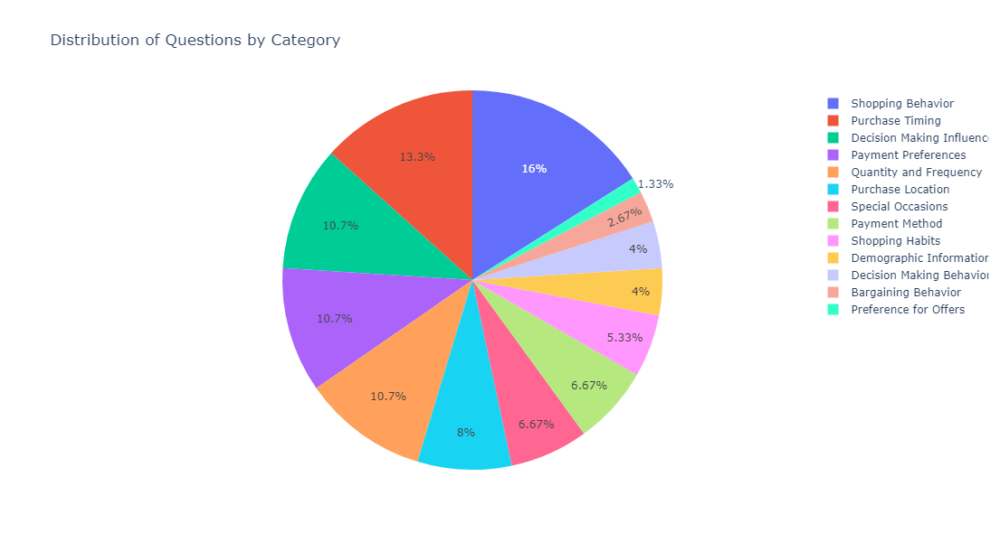

In [7]:
Demographic_Information_Questions = ['Q1', 'Q2', 'Q3']
Decision_Making_Behavior_Questions = ['Q4', 'Q5', 'Q6']
Bargaining_Behavior_Questions = ['Q7', 'Q8']
Decision_Making_Influence_Questions = ['Q9A', 'Q9B', 'Q9C', 'Q9D', 'Q9E', 'Q9F', 'Q9G', 'Q9H']
Shopping_Habits_Questions = ['Q10', 'Q11', 'Q12A', 'Q12B']
Purchase_Timing_Questions = ['Q13A', 'Q13B', 'Q13C', 'Q13D', 'Q14A', 'Q14B', 'Q14C', 'Q14D', 'Q14E', 'Q14F']
Special_Occasions_Questions = ['Q15A', 'Q15B', 'Q15C', 'Q15D', 'Q15E']
Purchase_Location_Questions = ['Q16A', 'Q16B', 'Q16C', 'Q16D', 'Q16E', 'Q16F']
Payment_Preferences_Questions = ['Q17A', 'Q17B', 'Q18A', 'Q18B', 'Q18C', 'Q18D', 'Q18E', 'Q18F']
Quantity_and_Frequency_Questions = ['Q19A', 'Q19B', 'Q19C', 'Q19D', 'Q19E', 'Q19F', 'Q19G', 'Q19H']
Preference_for_Offers_Questions = ['Q20']
Shopping_Behavior_Questions = ['Q21', 'Q22', 'Q23', 'Q24', 'Q25', 'Q26', 'Q27', 'Q28', 'Q29', 'Q30', 'Q31', 'Q32'] 
Payment_Method_Questions = ['Q33A', 'Q33B', 'Q33C', 'Q33D', 'Q33E']

question_categories = {
    "Demographic Information": Demographic_Information_Questions,
    "Decision Making Behavior": Decision_Making_Behavior_Questions,
    "Bargaining Behavior": Bargaining_Behavior_Questions,
    "Decision Making Influence": Decision_Making_Influence_Questions,
    "Shopping Habits": Shopping_Habits_Questions,
    "Purchase Timing": Purchase_Timing_Questions,
    "Special Occasions": Special_Occasions_Questions,
    "Purchase Location": Purchase_Location_Questions,
    "Payment Preferences": Payment_Preferences_Questions,
    "Quantity and Frequency": Quantity_and_Frequency_Questions,
    "Preference for Offers": Preference_for_Offers_Questions,
    "Shopping Behavior": Shopping_Behavior_Questions,
    "Payment Method": Payment_Method_Questions
}

# Count the number of questions in each category
category_counts = {category: len(questions) for category, questions in question_categories.items()}

# Plot the pie chart
fig = go.Figure(data=[go.Pie(labels=list(category_counts.keys()), values=list(category_counts.values()))])
fig.update_layout(title="Distribution of Questions by Category", width=800, height=600)
fig.show()


In [8]:
# Categorical Columns
cat_columns = ['Designation', 'Marital', 'Family', 'Education']
print(clr.text + '.: Categorical Columns :.' + clr.end)
print(f" {cat_columns}")
print("-"*50)

# Numerical Columns
num_columns = ['Age', 'Income']
print(clr.text + '.: Numerical Columns :.' + clr.end)
print(f" {num_columns}")
print("-"*50)

# Binary Columns
binary_columns = []
for column in df.columns:
    if df[column].nunique() == 2 and set(df[column].unique()) == {"Yes", "No"}:
        binary_columns.append(column)
        
print(clr.text + '.: Binary Columns :.' + clr.end)
print(f" {binary_columns}")
print("-"*50)

categorical_and_binary_cols = ['Designation', 'Marital', 'Family', 'Education','Q1',
       'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9A', 'Q9B', 'Q9C', 'Q9D',
       'Q9E', 'Q10', 'Q11', 'Q12A', 'Q12B', 'Q13A', 'Q13C', 'Q13D', 'Q14A',
       'Q14B', 'Q14C', 'Q14D', 'Q14E', 'Q14F', 'Q15A', 'Q15B', 'Q15C', 'Q15D',
       'Q15E', 'Q16A', 'Q16B', 'Q16C', 'Q16D', 'Q16E', 'Q16F', 'Q17A', 'Q17B',
       'Q18B', 'Q18C', 'Q18E', 'Q19A', 'Q19C', 'Q19D', 'Q19E', 'Q19F', 'Q19G',
       'Q19H', 'Q20', 'Q21', 'Q22', 'Q23', 'Q24', 'Q25', 'Q26', 'Q27', 'Q28',
       'Q29', 'Q30', 'Q31', 'Q32', 'Q33B', 'Q33C', 'Q33E']

print(clr.text + '.: Categorical and Binary Columns :.' + clr.end)
print(f" {categorical_and_binary_cols}")
print("-"*50)


.: Categorical Columns :.
 ['Designation', 'Marital', 'Family', 'Education']
--------------------------------------------------
.: Numerical Columns :.
 ['Age', 'Income']
--------------------------------------------------
.: Binary Columns :.
 ['Q2', 'Q3', 'Q7', 'Q8', 'Q10', 'Q11', 'Q21', 'Q22', 'Q23', 'Q24', 'Q26', 'Q27', 'Q28', 'Q29', 'Q31', 'Q32']
--------------------------------------------------
.: Categorical and Binary Columns :.
 ['Designation', 'Marital', 'Family', 'Education', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9A', 'Q9B', 'Q9C', 'Q9D', 'Q9E', 'Q10', 'Q11', 'Q12A', 'Q12B', 'Q13A', 'Q13C', 'Q13D', 'Q14A', 'Q14B', 'Q14C', 'Q14D', 'Q14E', 'Q14F', 'Q15A', 'Q15B', 'Q15C', 'Q15D', 'Q15E', 'Q16A', 'Q16B', 'Q16C', 'Q16D', 'Q16E', 'Q16F', 'Q17A', 'Q17B', 'Q18B', 'Q18C', 'Q18E', 'Q19A', 'Q19C', 'Q19D', 'Q19E', 'Q19F', 'Q19G', 'Q19H', 'Q20', 'Q21', 'Q22', 'Q23', 'Q24', 'Q25', 'Q26', 'Q27', 'Q28', 'Q29', 'Q30', 'Q31', 'Q32', 'Q33B', 'Q33C', 'Q33E']
------------------------

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Creating Dataset Report</h2>

In [9]:
ProfileReport(df[['Designation','Age','Marital','Family','Education','Income']], 
               title="Customer Segmentation ",
               minimal=True,
               progress_bar=False,
               samples=None,
               interactions=None,
               explorative=True,
               dark_mode=True,
               notebook={'iframe': {'height': '600px'},
                         'html': {'style': {'primary_color': clr}},
                         'missing_diagrams': {'heatmap': False, 'dendrogram': False}}
              ).to_notebook_iframe()

C:\Users\Darshan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\ydata_profiling\profile_report.py:506: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display

C:\Users\Darshan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\ydata_profiling\report\presentation\flavours\widget\correlation_table.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display

C:\Users\Darshan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\ydata_profiling\report\presentation\flavours\widget\duplicate.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPytho

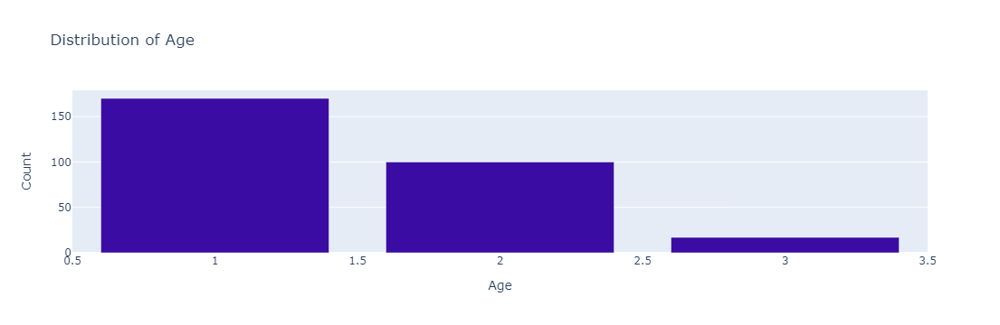

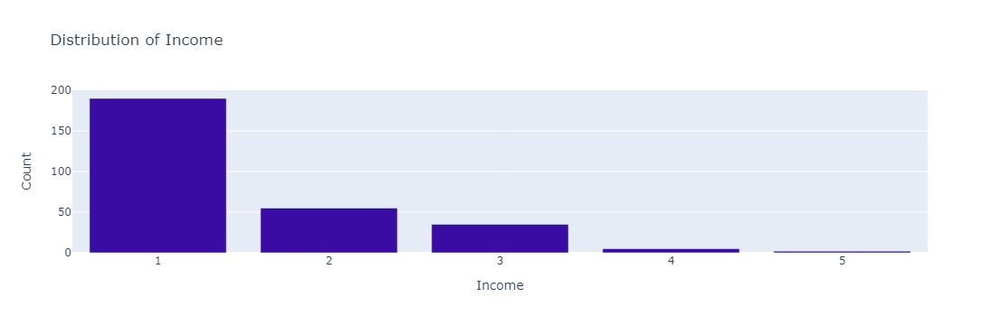

In [10]:
fig_age_bar = go.Figure(go.Bar(
    x=df['Age'].value_counts().index,
    y=df['Age'].value_counts().values,
    marker_color="#3A0CA3"
))
fig_age_bar.update_layout(title_text="Distribution of Age", xaxis=dict(title='Age'), yaxis=dict(title='Count'))

# Create bar chart for Income
fig_income_bar = go.Figure(go.Bar(
    x=df['Income'].value_counts().index,
    y=df['Income'].value_counts().values,
    marker_color="#3A0CA3"
))
fig_income_bar.update_layout(title_text="Distribution of Income", xaxis=dict(title='Income'), yaxis=dict(title='Count'))

# Show the plots
fig_age_bar.show()
fig_income_bar.show()


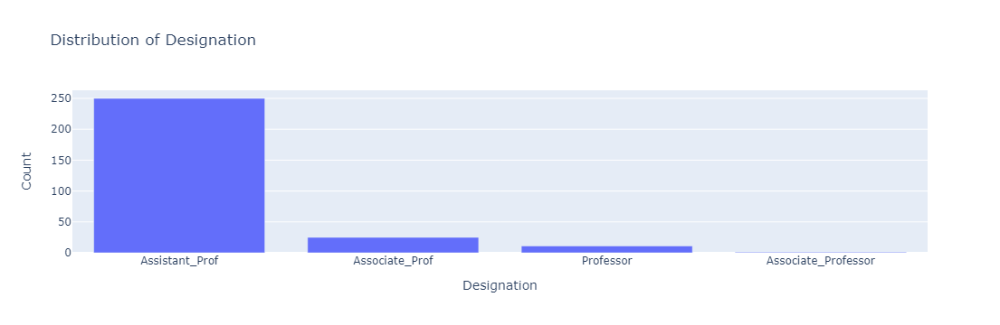

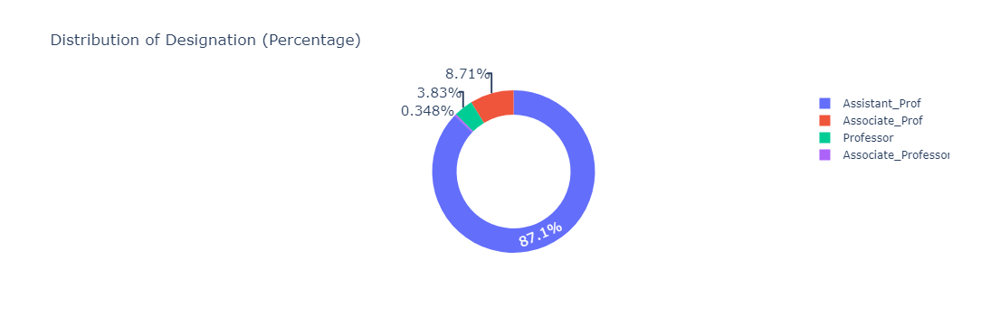

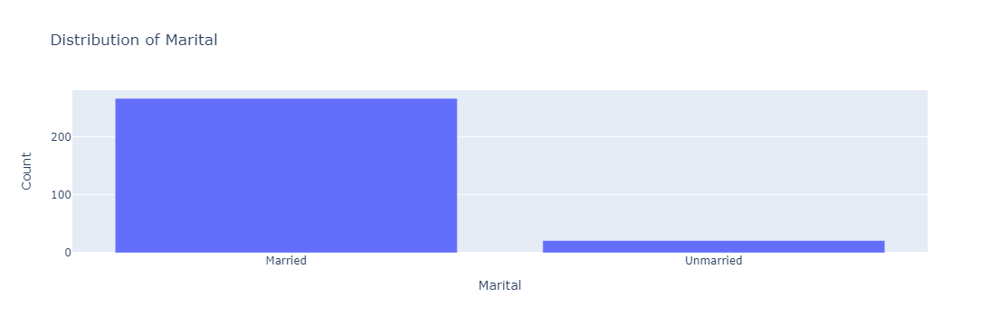

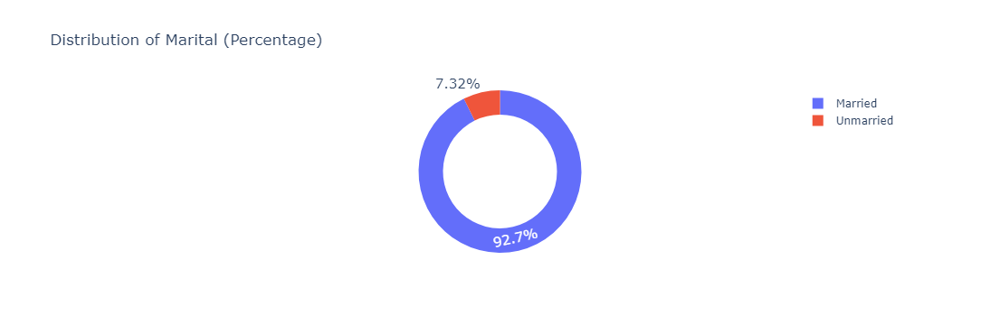

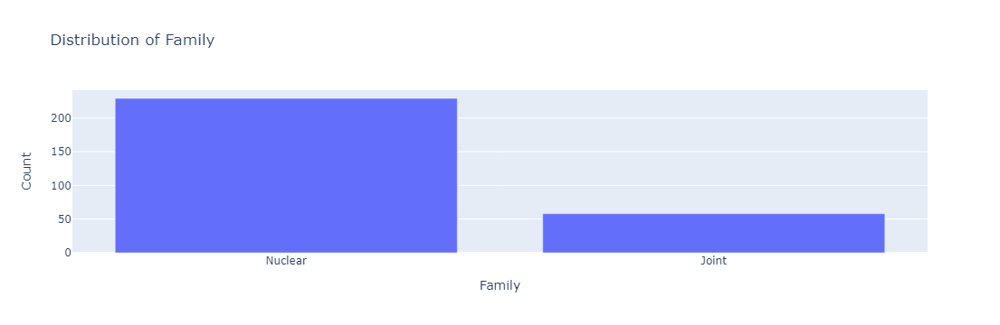

...

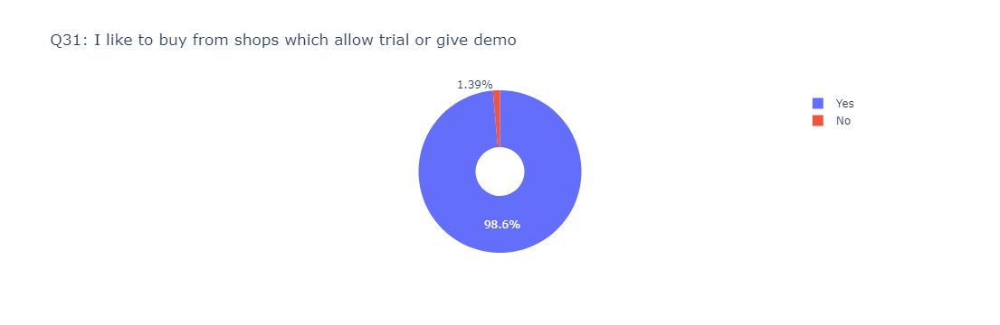

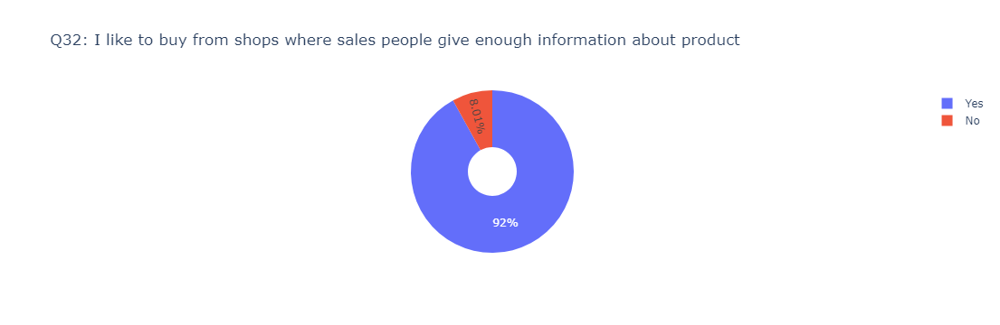

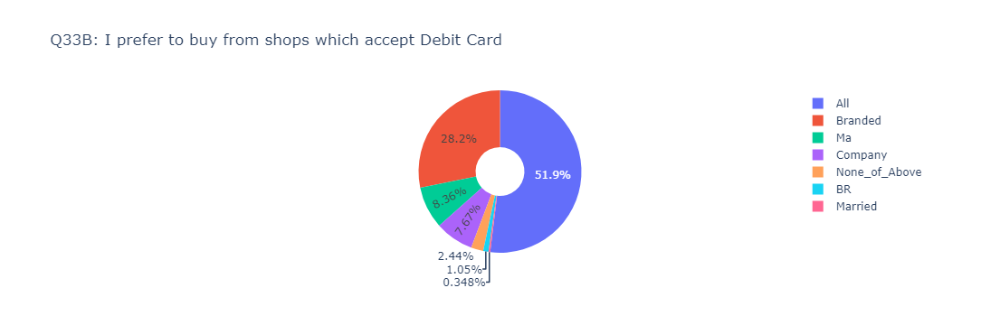

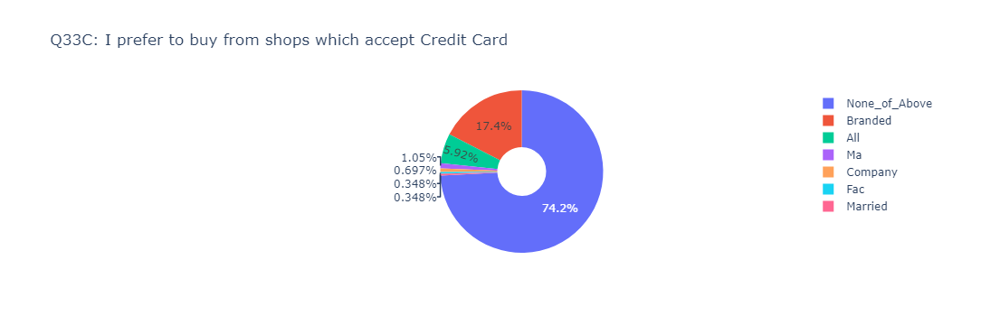

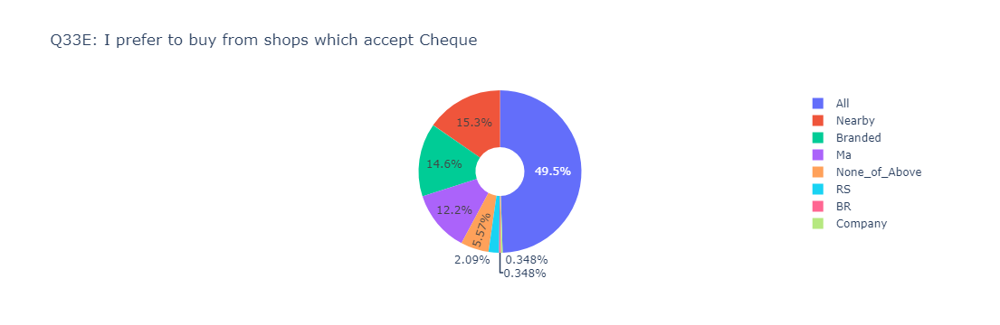

In [12]:
sns.set_palette(palette)

# Iterate through categorical columns
for i, col in enumerate(cat_columns):
    # Create subplots
    fig = go.Figure()
    
    # Plot count plot
    fig.add_trace(go.Bar(
        x=df[col].value_counts().index,
        y=df[col].value_counts().values,
        name='Count'
    ))
    
    # Update layout for count plot
    fig.update_layout(
        title=f"Distribution of {col}",
        xaxis=dict(title=col),
        yaxis=dict(title='Count')
    )
    
    # Show the plot
    fig.show()
    
    # Create another figure for pie chart
    fig_pie = go.Figure()
    
    # Plot pie chart
    fig_pie.add_trace(go.Pie(
        labels=df[col].value_counts().index,
        values=df[col].value_counts().values,
        hole=0.7,
        name='Percentage',
        hoverinfo='label+percent',
        textinfo='percent',
        textfont_size=15,
    ))
    
    # Update layout for pie chart
    fig_pie.update_layout(
        title=f"Distribution of {col} (Percentage)",
    )
    
    # Show the pie chart
    fig_pie.show()

for column in categorical_and_binary_cols:
    # Calculate value counts
    counts = df[column].value_counts()
    
    # Create pie chart
    fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts.values, hole=.3)])
    fig.update_layout(title_text=f'{column}: {questions[column][0]}', showlegend=True)
    fig.show()


## 💡 Plot Analysis
<div class="explain-box">
    <p>From <b>dataset plot</b>, we have <b>observed</b> that:</p>
    <blockquote style="color: #000000;">
        <ul>
            <li>The distribution of the <b>Education</b> column shows that a majority of respondents have pursued or completed a PhD, while a smaller portion are currently pursuing a PhD or have no PhD.</li>
            <li>In the <b>Marital</b> column, most respondents are married, with a smaller proportion being single.</li>
            <li>The <b>Family</b> column indicates that the majority of respondents come from nuclear families, with fewer respondents from joint families.</li>
            <li>Regarding the <b>Income</b> column, there is a varied distribution, with a significant number of respondents having a low income and a smaller portion having a high income.</li>
            <li>The distribution of <b>Age</b> shows that the majority of respondents fall into the younger age group, with fewer respondents in the older age group.</li>
        </ul>
    </blockquote>
</div>

<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id="6"></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">6. | Data Preprocessing ⚙️</h1>
In this section, I will be <b>preprocessing</b> the data to perform <b>clustering operations</b>.

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">6.1 | Processing Pipeline 🪠</h2>
<div class="explain-box">
    This section will <b>create a preprocessing pipeline</b> for numerical and categorical columns and <b>apply them to the <code>x_train</code> and <code>x_test</code> data</b>. Not all columns will go through preprocessing. For <b>all numerical columns</b>, scaling will be carried out using a <b>MinMax scaler</b> since the dataset used is a <b>small dataset</b> where the presence of outliers dramatically affects the performance of a model. While for <b>categorical columns with more than two categories, one-hot encoding will be carried out</b> and for <b>categorical columns with hierarchical order, ordinal encoding will be carried out</b></div>

<div class="explain-box">
    Description of Columns and <b> Encoding or Scaling Required</b>.<br>
    
<table style="font-family: 'Times New Roman'; font-weight: 300; font-size: 12px; text-align: left; padding: 8px; border-collapse: collapse; width: 100%;">
  <thead>
    <tr>
      <th style="width: 40px; font-family: 'Open Sans'; font-weight: 900; text-align: center; font-size: 14px; background-color: #0096C7">Column</th>
      <th style="width: 120px;font-family: 'Open Sans'; font-weight: 900; text-align: center; font-size: 14px; background-color: #0096C7">Description</th>
      <th style="width: 40px;font-family: 'Open Sans'; font-weight: 900; text-align: center; font-size: 14px; background-color: #0096C7">Encoding or Scalling</th>
    </tr>
  </thead>
    <tr>
        <td>Designation</td>
        <td>This column represents the positions or designations of the respondents. Since it has a hierarchical order, using ordinal encoding would be more appropriate. Ordinal encoding assigns numerical values based on the position of each category in the
            hierarchy, preserving the hierarchical relationship between categories.</td>
        <td>Ordinal Encoding</td>
    </tr>
    <tr>
        <td>Age</td>
        <td>This column represents the age of the respondents in years. Since it's a numerical variable, no encoding is required. However, you may need to scale it using Min-Max Scaling if the range of ages is large.</td>
        <td>Min-Max Scaling required</td>
    </tr>
    <tr>
        <td>Marital</td>
        <td>This column represents the marital status of the respondents. Since it's a nominal categorical variable with no hierarchical order, One-Hot Encoding can be used.</td>
        <td>One-Hot Encoding</td>
    </tr>
    <tr>
        <td>Family</td>
        <td>This column indicates the type of family the respondents belong to. Since it's a nominal categorical variable with no hierarchical order, One-Hot Encoding can be used.</td>
        <td>One-Hot Encoding</td>
    </tr>
    <tr>
        <td>Education</td>
        <td>This column represents the education level of the respondents. It has a hierarchical order, such as Non-PhD, Post-PhD, and PhD. Therefore, using ordinal encoding would be more suitable. Ordinal encoding assigns numerical values based on the position
            of each category in the hierarchy, preserving the hierarchical relationship between categories.</td>
        <td>Ordinal Encoding</td>
    </tr>
    <tr>
        <td>Income</td>
        <td>This column represents the approximate monthly income of the respondents. Since it's a numerical variable, no encoding is required. However, you may need to scale it using Min-Max Scaling if the range of incomes is large.</td>
        <td>Min-Max Scaling required</td>
    </tr>
    <tr>
        <td>Q1 to Q33F</td>
        <td>nominal categorical variables with no hierarchical order. You can use One-Hot Encoding to encode the responses into binary vectors</td>
        <td>One-Hot Encoding</td>
    </tr>
</table>

In [13]:
# --- Creating copy of Dataset ---
X = df.copy()

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Ordinal Encoding</h2>

In [14]:
designation_mapping = {
    'Assistant_Prof': 0,
    'Associate_Prof': 1,
    'Associate_Professor': 2, 
    'Professor': 3
}
X['Designation'].replace(designation_mapping, inplace=True)


In [15]:
education_mapping = {
    'No_PhD': 0,
    'Pursuing_PhD': 1,
    'PhD': 2,
    'Post_PhD': 3
}
X['Education'].replace(education_mapping, inplace=True)

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Min Max Scaling</h2>

In [16]:
# Scaling Age 
df['Age'] = (df['Age'] - df['Age'].min()) / (df['Age'].max() -df['Age'].min())

# Scaling Income 
df['Income'] = (df['Income'] - df['Income'].min()) / (df['Income'].max() -df['Income'].min())


<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Binary Encoding</h2>

In [17]:
for column in binary_columns:
    X.replace({column: {'No': 0, 'Yes': 1}}, inplace=True)

In [18]:
# Will Later used
X_Clustred = X.copy()

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">One Hot Encoding</h2>

In [19]:
one_hot_columns = [
    'Education', 'Marital', 'Family', 'Q1', 'Q4', 'Q5', 'Q6',
    'Q9A', 'Q9B', 'Q9C', 'Q9D', 'Q9E', 'Q12A', 'Q12B', 'Q13A', 'Q13C', 'Q13D',
    'Q14A', 'Q14B', 'Q14C', 'Q14D', 'Q14E', 'Q14F', 'Q15A', 'Q15B', 'Q15C',
    'Q15D', 'Q15E', 'Q16A', 'Q16B', 'Q16C', 'Q16D', 'Q16E', 'Q16F', 'Q17A',
    'Q17B', 'Q18B', 'Q18C', 'Q18E', 'Q19A', 'Q19C', 'Q19D', 'Q19E', 'Q19F',
    'Q19G', 'Q19H', 'Q20', 'Q25', 'Q30', 'Q33B', 'Q33C', 'Q33E'
]

encoder = OneHotEncoder(drop='if_binary', sparse=False)
X_encoded = encoder.fit_transform(X[one_hot_columns])

encoded_columns = encoder.get_feature_names_out(one_hot_columns)

X_processed_df = pd.DataFrame(X_encoded, columns=encoded_columns, index=X.index)

X_processed_df = pd.concat([X_processed_df, X.drop(columns=one_hot_columns)], axis=1)

In [20]:
X_processed_df.shape

(287, 333)

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">6.2 | Anomaly Detection using Isolation Forest</h2>
<div class="explain-box">
    <blockquote style="color: #000000;">
        <b>Isolation Forest</b> is an ensemble-based anomaly detection algorithm that is particularly effective for identifying outliers or anomalies in high-dimensional datasets. It works by isolating anomalous data points in a tree structure and measuring their isolation depth.<br><br>
        The algorithm randomly selects a feature and a split value to partition the data at each node of the tree. Anomalies are expected to require fewer splits to be isolated, resulting in shorter path lengths in the tree. By averaging the path lengths across multiple trees, Isolation Forest can effectively identify anomalies.<br><br>
        <center>
            <img src="https://datascientest.com/en/wp-content/uploads/sites/9/2021/08/python_anomaly_detection_isolation_forest.gif"Isolation Forest" width="40%"><br>
        </center>
    </blockquote>
    <p>Isolation Forest is well-suited for detecting anomalies in large-scale datasets with mixed attribute types. It is robust to the presence of irrelevant features and can efficiently handle high-dimensional data. Isolation Forest has applications in cybersecurity, fraud detection, network intrusion detection, and outlier detection in sensor data.</p>
</div>


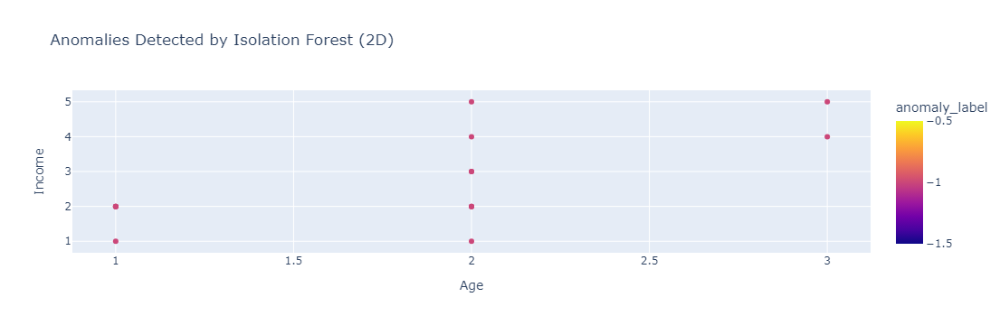

In [21]:
numerical_features = X_processed_df.select_dtypes(include=['float64', 'int64'])

model = IsolationForest(contamination=0.05) 

model.fit(numerical_features)

X_processed_df['anomaly_score'] = model.decision_function(numerical_features)
X_processed_df['anomaly_label'] = model.predict(numerical_features)

anomalies = X_processed_df[X_processed_df['anomaly_label'] == -1]

#Dropping anomalies from DataFrame
X_processed_df = X_processed_df[X_processed_df['anomaly_label'] != -1]

# Drop the anomaly_score and anomaly_label columns
X_processed_df.drop(columns=['anomaly_score', 'anomaly_label'], inplace=True)

fig = px.scatter(anomalies, x='Age', y='Income', color='anomaly_label', 
                 title='Anomalies Detected by Isolation Forest (2D)')
fig.show()

In [22]:
# DataFrame After Removing Anamolies
X_processed_df.shape

(272, 333)

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">6.3 | Features Separating and Splitting 🪓</h2>
<div class="explain-box">
     In this section,the dataset will be splitted into <b>90:10 ratio</b> (90% training and 10% testing).
</div>

In [23]:
# --- Splitting Dataset ---
X_train, X_test = train_test_split(X_processed_df, test_size=0.1, random_state=42)

In [24]:
print(f"{X_train.shape = }")
print(f"{X_test.shape = }")

X_train.shape = (244, 333)
X_test.shape = (28, 333)


<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id="7"></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">7 | Dimensionality Reduction 🪄</h1>
<div class="explain-box">
</div>

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Principle Component Analysis 🪄</h2>
<div class="explain-box">
</div>

<div class="explain-box">
    <blockquote style="color: #000000;">
        <p><b>Principle Component Analysis</b> or PCA,  is a statistical technique used for dimensionality reduction and data compression. It aims to transform high-dimensional data into a lower-dimensional space while retaining most of the important information.</p><br>
        <p>
            In this dataset there many features present.PCA can be used to represent data from higher dimenetions to lower dimention which help in order to better segment the customers and better visualization
        </p>
        <center>
            <img src="assets/PCA_animation.gif" alt="Principle Component Analysis" width="100%"><br>
        </center>
        <p><b>Explained variance:</b><br>
            Explained variance refers to the proportion of total variance in the dataset that a specific principal component accounts for in PCA. It helps assess the significance of each component in capturing the variability of the data.
        </p><br>
        <p><b>Cumulative variance:</b><br>
            Cumulative variance represents the total amount of variance explained by a subset of components in a dataset. In PCA, it's the sum of variances explained by each component up to a certain point. 
        </p>   
    </blockquote>
</div>

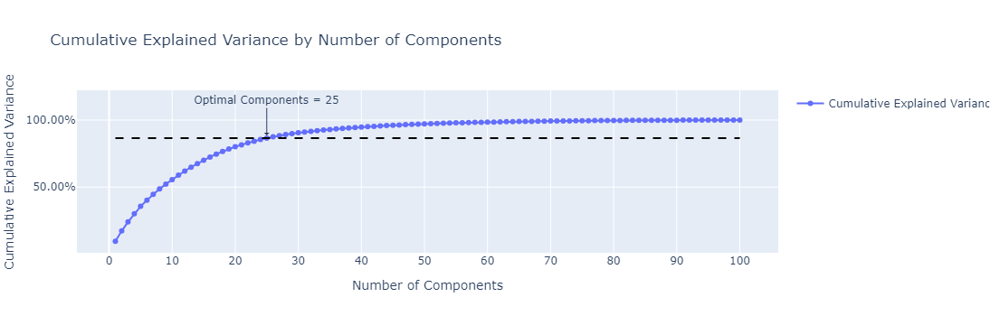

In [25]:
pca = PCA(n_components=100)
pca.fit(X_train)

explained_variance_ratio = pca.explained_variance_ratio_

cumulative_variance = np.cumsum(explained_variance_ratio)

optimal_components = np.where(np.diff(cumulative_variance) < 0.01)[0][0] + 1

fig = go.Figure()

fig.add_trace(go.Scatter(x=list(range(1, 101)), y=list(cumulative_variance), mode='lines+markers', name='Cumulative Explained Variance'))

fig.add_shape(
    type='line',
    x0=1,
    y0=cumulative_variance[optimal_components - 1],
    x1=100,
    y1=cumulative_variance[optimal_components - 1],
    line=dict(color='black', width=2, dash='dash')
)

fig.add_annotation(
    x=25,
    y=cumulative_variance[optimal_components - 1] + 0.02,
    text=f'Optimal Components = {optimal_components}',
    showarrow=True,
    arrowhead=1,
    ax=0,
    ay=-40
)

fig.update_layout(
    title='Cumulative Explained Variance by Number of Components',
    xaxis_title='Number of Components',
    yaxis_title='Cumulative Explained Variance',
    xaxis=dict(dtick=10),
    yaxis=dict(tickformat='.2%'),
    showlegend=True
)

fig.show()


In [26]:
# Initiating PCA to reduce dimensions aka features to 3
pca = PCA(n_components=3)
pca.fit(X_train)
X_reduced = pd.DataFrame(pca.transform(X_train),columns=(["x","y", "z"]))
print("Reduced X After PCA")
print("-"*30)
X_reduced.describe().T

Reduced X After PCA
------------------------------


,count,mean,std,min,25%,50%,75%,max
x,244.0,-7.644159e-17,1.656185,-2.466837,-1.386465,-0.201163,1.365579,3.488232
y,244.0,1.456030e-17,1.489839,-2.796929,-1.085418,0.138452,0.889171,4.142758
z,244.0,5.824121e-17,1.390931,-3.200785,-0.709497,-0.095810,0.716121,4.858280


<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id = '8'></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">8. | Clustering ✨</h1>
<div class="explain-box">
    This section will <b>implement various machine learning models</b> as mentioned in Introduction section. In addition, explanation for each models also will be discussed.
</div>

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">8.1 | K-Means Clustering</h2>
<div class="explain-box">
    <blockquote style="color: #000000;">
        <b>K-Means clustering</b> is a popular unsupervised machine learning algorithm used for partitioning a dataset into a specified number of clusters. It aims to group similar data points together while keeping dissimilar points in different clusters. K-Means clustering is widely used for exploratory data analysis, data visualization, and pattern recognition.<br><br>
        The algorithm works by iteratively assigning each data point to the nearest centroid and then recalculating the centroids based on the mean of the data points in each cluster. This process continues until the centroids stabilize or the maximum number of iterations is reached.<br><br>
        <center>
            <img src="assets/K_means.gif" alt="K-Means Clustering" width="40%"><br>
        </center>
    </blockquote>
    <p>Using K-Means clustering allows for the identification of natural groupings or clusters within the dataset, enabling better understanding and interpretation of the underlying structure of the data. It is particularly useful for segmenting data into homogeneous subgroups, which can then be analyzed separately or used as features in subsequent machine learning models.</p>
</div>


<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Finding the optimal number of clusters based on the maximum silhouette score</h2>

In [27]:
silhouette_scores = []

k_values = range(2, 5)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_train)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(X_train, labels)
    silhouette_scores.append(silhouette_avg)

optimal_k = k_values[np.argmax(silhouette_scores)]
max_silhouette_score = max(silhouette_scores)

print("Optimal number of clusters:", optimal_k)
print("Maximum silhouette score:", max_silhouette_score)


Optimal number of clusters: 4
Maximum silhouette score: 0.11334930313916518


In [28]:
# Initiating the KMeans model
kmeans = KMeans(n_clusters=4)

# Fit model and predict clusters
Kmeans_X = X_reduced.copy()
yhat_kmeans = kmeans.fit_predict(X_reduced)

# Assigning cluster labels to the reduced data
Kmeans_X["Clusters"] = yhat_kmeans

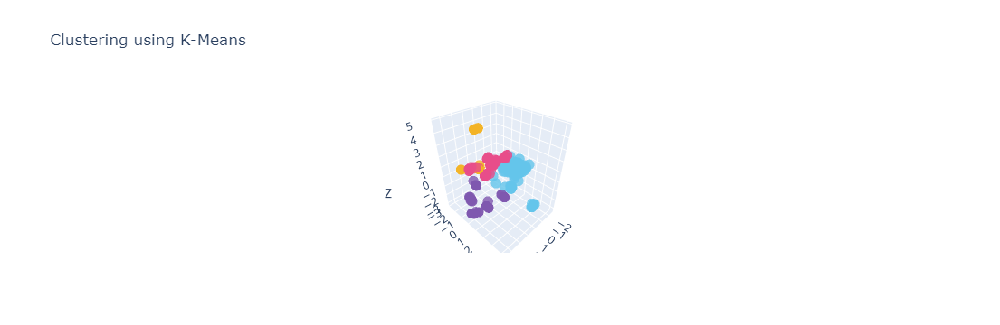

In [29]:
palette = ["#7F58AF","#64C5EB", "#E84D8A","#F3B326"]
fig = go.Figure(data=[go.Scatter3d(
    x=Kmeans_X['x'],
    y=Kmeans_X['y'],
    z=Kmeans_X['z'],
    mode='markers',
    marker=dict(
        size=4,
        color=Kmeans_X["Clusters"],
        colorscale= palette,
        opacity=0.8
    )
)])

# Update layout
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    ),
    title="Clustering using K-Means")

# Show the plot
fig.show()


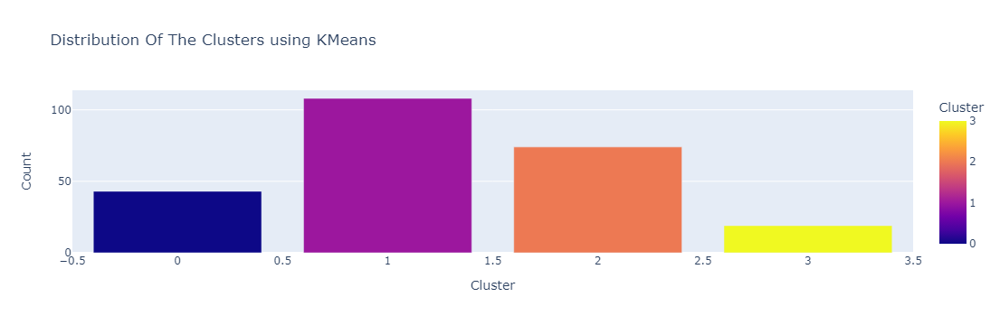

In [30]:
cluster_counts = Kmeans_X["Clusters"].value_counts().reset_index()
cluster_counts.columns = ["Cluster", "Count"]

# Plot countplot using Plotly
fig = px.bar(cluster_counts, x="Cluster", y="Count", color="Cluster",
             labels={"Cluster": "Cluster", "Count": "Count"},
             title="Distribution Of The Clusters using KMeans",
             color_discrete_sequence=palette)
fig.show()


<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">8.2 | DBSCAN Clustering</h2>
<div class="explain-box">
    <blockquote style="color: #000000;">
        <b>DBSCAN (Density-Based Spatial Clustering of Applications with Noise)</b> is a clustering algorithm that groups together closely packed points based on density. Unlike K-Means, DBSCAN does not require specifying the number of clusters beforehand and can identify clusters of arbitrary shapes and sizes.<br><br>
        The algorithm defines clusters as dense regions of points separated by regions of lower density. Points in dense regions are considered core points, while points in lower-density regions that are close to core points are considered border points. Points that are neither core nor border points are classified as noise.<br><br>
        <center>
            <img src="assets/dbscan.svg" alt="DBSCAN Clustering" width="40%"><br>
        </center>
    </blockquote>
    <p>DBSCAN is particularly useful for datasets with complex structures and varying densities. It automatically discovers clusters and is robust to outliers. Additionally, DBSCAN does not assume clusters to be globular or convex-shaped, making it suitable for a wide range of applications in data mining, pattern recognition, and spatial data analysis.</p>
</div>


In [31]:
dbscan = DBSCAN(eps=0.5, min_samples=5)

DBscan_X = X_reduced.copy()
yhat_dbscan = dbscan.fit_predict(X_reduced)

DBscan_X["Clusters"] = yhat_dbscan


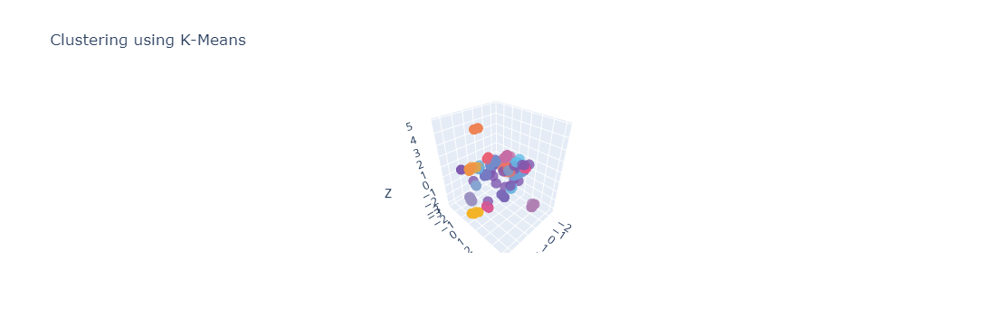

In [32]:
fig = go.Figure(data=[go.Scatter3d(
    x=DBscan_X['x'],
    y=DBscan_X['y'],
    z=DBscan_X['z'],
    mode='markers',
    marker=dict(
        size=4,
        color=DBscan_X["Clusters"],
        colorscale=palette,
        opacity=0.8
    )
)])

# Update layout
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    ),
    title="Clustering using K-Means")

# Show the plot
fig.show()


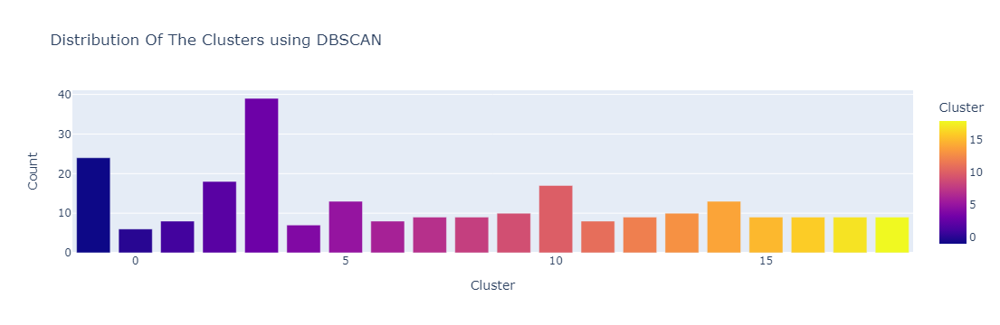

In [33]:
cluster_counts = DBscan_X["Clusters"].value_counts().reset_index()
cluster_counts.columns = ["Cluster", "Count"]

fig = px.bar(cluster_counts, x="Cluster", y="Count", color="Cluster",
             labels={"Cluster": "Cluster", "Count": "Count"},
             title="Distribution Of The Clusters using DBSCAN",
             color_discrete_sequence=palette)
fig.show()


<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">8.3 | Hierarchical Clustering</h2>
<div class="explain-box">
    <blockquote style="color: #000000;">
        <b>Hierarchical clustering</b> is a method of cluster analysis that builds a hierarchy of clusters. It does not require specifying the number of clusters beforehand and can be visualized using a dendrogram. There are two main types of hierarchical clustering: agglomerative and divisive.<br><br>
        <b>Agglomerative hierarchical clustering</b> starts with each data point as its own cluster and iteratively merges the closest pairs of clusters until only one cluster remains. <b>Divisive hierarchical clustering</b>, on the other hand, starts with all data points in one cluster and recursively splits clusters into smaller clusters until each data point is in its own cluster.<br><br>
        <center>
            <img src="assets/hierarchical_clustering.png" alt="Hierarchical Clustering" width="40%"><br>
        </center>
    </blockquote>
    <p>Hierarchical clustering is useful for exploring the structure of the data and identifying nested clusters at different levels of granularity. It provides insights into the relationships between data points and can be visualized to aid interpretation. Hierarchical clustering is commonly used in biological taxonomy, social network analysis, and customer segmentation.</p>
</div>


In [34]:
AC = AgglomerativeClustering(n_clusters=4)

AC_X = X_reduced.copy()
yhat_AC = AC.fit_predict(X_reduced)

AC_X["Clusters"] = yhat_AC

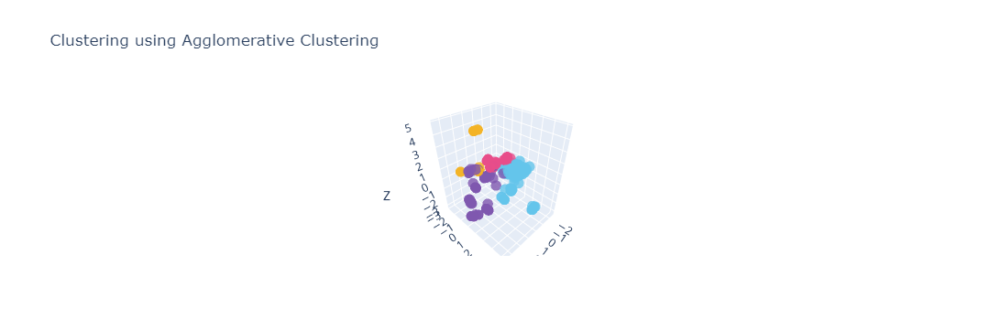

In [35]:
fig = go.Figure(data=[go.Scatter3d(
    x=AC_X['x'],
    y=AC_X['y'],
    z=AC_X['z'],
    mode='markers',
    marker=dict(
        size=4,
        color=AC_X["Clusters"],
        colorscale=palette,
        opacity=0.8
    )
)])

# Update layout
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    ),
    title="Clustering using Agglomerative Clustering")
# Show the plot
fig.show()


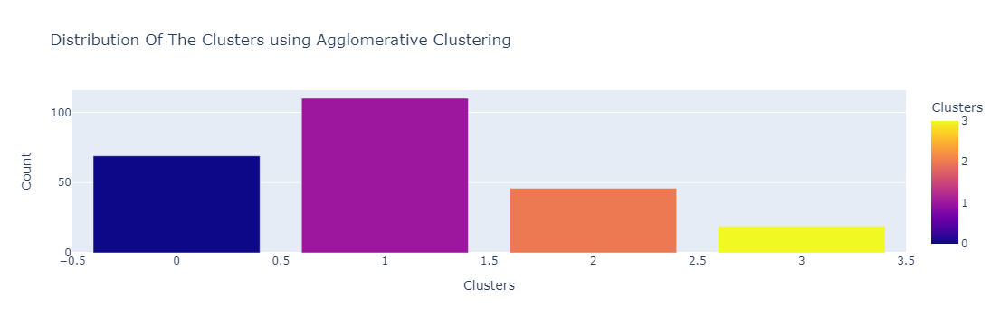

In [36]:
cluster_counts = AC_X["Clusters"].value_counts().reset_index()
cluster_counts.columns = ["Cluster", "Count"]

# Plot countplot using Plotly
fig = px.bar(cluster_counts, x="Cluster", y="Count", color="Cluster",
             labels={"Cluster": "Clusters", "Count": "Count"},
             title="Distribution Of The Clusters using Agglomerative Clustering",
             color_discrete_sequence=palette)
fig.show()


<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">💡 Clustering Analysis</h2>
<div class="explain-box">
    <p>
    Now we have segmented diffrent types of customers based on their features and analyzed their behavior pattern 
    </p>
</div>

<p>Here are different <b>segments of customers</b> we have observed:</p>
<blockquote style="color: #000000;">
    <ul>
        <li><b>Cluster 1: Independent Decision Makers with Varied Shopping Habits</b></li>
        <p>They make decisions independently, consult with family selectively, and shop across a variety of outlets. Their purchases are based on personal needs, and they use a mix of payment methods. Quantity and frequency of purchases vary.</p>
        <li><b>Cluster 2: Consultative Decision Makers with Family Influence</b></li>
        <p>They involve family in decisions, prefer branded products, and shop more frequently. They prefer structured shopping from branded retailers and company showrooms, often using credit cards or cash for payments.</p>
        <li><b>Cluster 3: Bargaining Decision Makers with Opportunistic Shopping Habits</b></li>
        <p>Actively involved in bargaining, they make independent decisions, seizing bargains and discounts. They buy a mix of branded and non-branded products, with opportunistic shopping behaviors across various locations. Cash is their preferred payment method.</p>
        <li><b>Cluster 4: Routine Decision Makers with Fixed Shopping Patterns</b></li>
        <p>They decide independently, following fixed patterns, and prefer specific outlets for branded products. Their purchases are timed, often around specific occasions, and they prefer shops offering discounts or fixed rates. Debit cards or cash are their preferred payment methods.</p>
    </ul>
</blockquote>


<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id='9'></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">9 | Association Rule Mining</h2>

<h2 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">9.1 | Apriori Algorithm</h2>
<div class="explain-box">
    <blockquote style="color: #000000;">
        The <b>Apriori algorithm</b> is a classic algorithm used for association rule mining in transactional datasets. It aims to discover frequent itemsets, which are sets of items that frequently occur together in transactions. These itemsets are then used to generate association rules that describe the relationships between items.<br><br>
        The Apriori algorithm employs a bottom-up approach, where it starts by identifying individual items that meet a minimum support threshold. It then iteratively generates larger itemsets by combining smaller itemsets that also meet the minimum support threshold.<br><br>
        <center>
            <img src="assets/apriori.png" alt="Apriori Algorithm" width="40%"><br>
        </center>
    </blockquote>
    <p>The Apriori algorithm is widely used in market basket analysis, recommendation systems, and customer behavior analysis. It helps businesses uncover patterns and trends in transactional data, leading to insights that can be used for targeted marketing, cross-selling, and product placement strategies.</p>
</div>


In [37]:
apriori_df = pd.read_excel("survey.xlsx")

binary_columns = []
for column in apriori_df.columns:
    if apriori_df[column].nunique() == 2 or set(apriori_df[column].unique()) == {"Yes", "No"}:
        binary_columns.append(column)

association_dataset = []
for index, row in apriori_df.iterrows():
    association_row = []
    for column in binary_columns:
        if row[column] == "Yes":
            association_row.append(column)
    association_dataset.append(association_row)

# Convert elements in the list to strings
association_dataset = [[str(item) for item in row] for row in association_dataset]

# Initialize and fit the transaction encoder
encoder = TransactionEncoder()
encoder.fit(association_dataset)

# Transform the transactions into a one-hot encoded DataFrame
onehot = encoder.transform(association_dataset)
df_transformed = pd.DataFrame(onehot, columns=encoder.columns_)

# Find frequent itemsets with minimum support
frequent_itemsets = apriori(df_transformed, min_support=0.9, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.9)

styled_df = rules.head(20).reset_index(drop=True).style.background_gradient(cmap='Blues').set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', '')]}])
styled_df

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,frozenset({'Q23'}),frozenset({'Q3'}),0.982578,0.996516,0.982578,1.000000,1.003497,0.003424,inf,0.200000
1,frozenset({'Q3'}),frozenset({'Q23'}),0.996516,0.982578,0.982578,0.986014,1.003497,0.003424,1.245645,1.000000
2,frozenset({'Q23'}),frozenset({'Q31'}),0.982578,0.986063,0.975610,0.992908,1.006942,0.006726,1.965157,0.395714
3,frozenset({'Q31'}),frozenset({'Q23'}),0.986063,0.982578,0.975610,0.989399,1.006942,0.006726,1.643438,0.494643
4,frozenset({'Q23'}),frozenset({'Q32'}),0.982578,0.919861,0.912892,0.929078,1.010020,0.009057,1.129965,0.569466
5,frozenset({'Q32'}),frozenset({'Q23'}),0.919861,0.982578,0.912892,0.992424,1.010020,0.009057,2.299652,0.123797
6,frozenset({'Q31'}),frozenset({'Q3'}),0.986063,0.996516,0.982578,0.996466,0.999951,-0.000049,0.986063,-0.003534
7,frozenset({'Q3'}),frozenset({'Q31'}),0.996516,0.986063,0.982578,0.986014,0.999951,-0.000049,0.996516,-0.013986
8,frozenset({'Q32'}),frozenset({'Q3'}),0.919861,0.996516,0.919861,1.000000,1.003497,0.003205,inf,0.043478
9,frozenset({'Q3'}),frozenset({'Q32'}),0.996516,0.919861,0.919861,0.923077,1.003497,0.003205,1.041812,1.000000


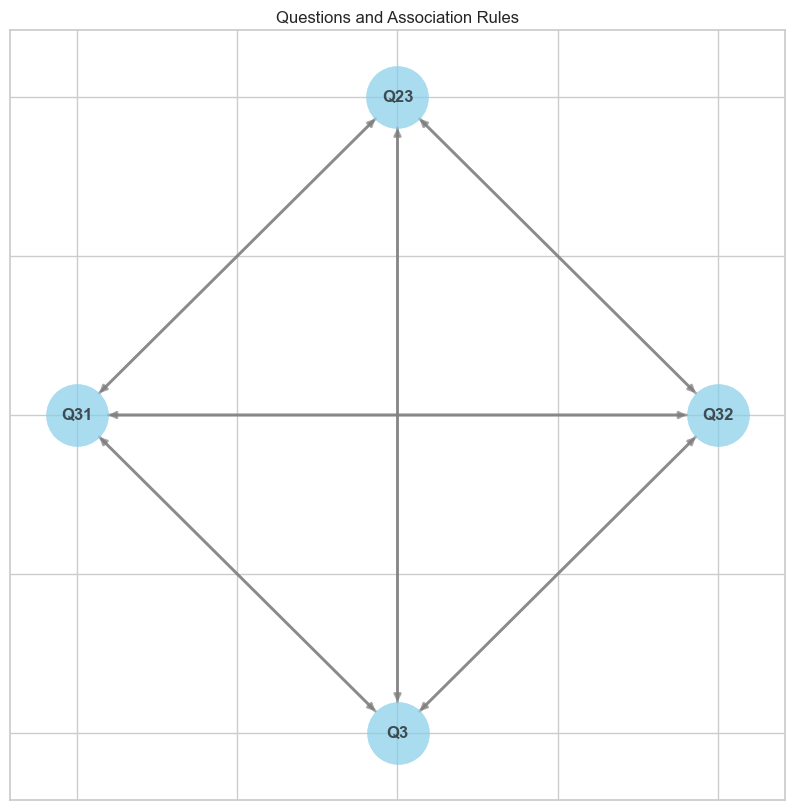

In [38]:

unique_questions = set()
for antecedent, consequent in zip(rules['antecedents'], rules['consequents']):
    unique_questions.update(antecedent)
    unique_questions.update(consequent)

G = nx.DiGraph()

for question in unique_questions:
    G.add_node(question)

for idx, rule in rules.iterrows():
    antecedent, consequent = rule['antecedents'], rule['consequents']
    for a in antecedent:
        for c in consequent:
            G.add_edge(a, c)

pos = nx.circular_layout(G)

plt.figure(figsize=(10, 10))
nx.draw_networkx(G, pos, with_labels=True, node_size=2000, node_color='skyblue', font_size=12, font_weight='bold', edge_color='grey', width=2, alpha=0.7)
plt.title("Questions and Association Rules")
plt.show()


<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>

<a id="10"></a>
<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">10. | Conclusions and Future Improvements 🧐</h1>
<div class="explain-box">
    From the results of dataset analysis and implementation of Clustering Algorithmns and  Association Rule Mining, <b>it can be concluded as follows</b>:
    <blockquote style="color: #000000;">
        <ul>
            <li><b>EDA (Exploratory Data Analysis):</b> The exploratory data analysis revealed important insights into the structure and distribution of the data. It helped in understanding the characteristics of different variables and their relationships.</li>
            <li><b>PCA (Principal Component Analysis):</b> PCA was employed for dimensionality reduction, which enabled visualizing high-dimensional data in lower dimensions. It helped in identifying the most significant features contributing to the variance in the dataset.</li>
            <li><b>Clustering:</b> Clustering algorithms, such as K-means,DBSCAN and Agglomerative Clustering, were applied to group similar data points together. This facilitated the identification of patterns and subgroups within the data.</li>
            <li><b>Anomaly Detection:</b> Anomaly detection techniques were utilized to identify unusual or outlying observations in the dataset. This aided in detecting potential errors or anomalies that deviate from normal behavior.</li>
            <li><b>Apriori Algorithm:</b> The Apriori algorithm was used for association rule mining to discover interesting relationships between variables. It helped in <b>uncovering more than 50 frequent patterns and association rules</b>, which could be valuable for <b>Decision-making and Marketing</b>.</li>
        </ul>
        <li><b>Segmented Customers</b> 
            <li type="disc">Independent Shoppers: Make decisions independently, varying shopping habits, buy as needed.</li>
            <li type="disc">Family Consulters: Consult with family for decisions, prefer branded products, structured shopping.</li>
            <li type="disc">Bargain Hunters: Actively bargain, opportunistic shopping, buy varied products online and offline.</li>
            <li type="disc">Routine Shoppers: Make decisions themselves, fixed shopping patterns, prefer specific shops and timings.</li>
        </li>
        </ul>       
    </blockquote>
</div>

<a id='End'></a>
## <center><h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Thank You</h1></center>

<a href="#top" style="position: fixed; bottom: 20px; right: 20px; font-size: 14px; font-family: 'Times New Roman'; color: #007bff; text-decoration: none;">Back to Top ⬆️</a>